### Notebook for the inference of cell-cell communications on vascular cells data using `LIANA+`

- **Developed by**: Carlos Talavera-López
- **Würzburg Institute for Systems Immunology, Faculty of Medicine, Julius-Maximilian-Universität Würzburg**
- **Created**: 240131
- **Latest version**: 240131

### Import required modules

In [1]:
import anndata
import numpy as np
import liana as li
import pandas as pd
import scanpy as sc

from liana.method import singlecellsignalr, connectome, cellphonedb, natmi, logfc, cellchat, geometric_mean

### Set up working environment

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.3
scanpy      1.9.6
-----
PIL                 10.1.0
asttokens           NA
comm                0.2.0
cycler              0.12.1
cython_runtime      NA
dateutil            2.8.2
debugpy             1.8.0
decorator           5.1.1
exceptiongroup      1.1.3
executing           2.0.1
h5py                3.10.0
ipykernel           6.26.0
ipywidgets          8.1.1
jedi                0.19.1
joblib              1.3.2
kiwisolver          1.4.5
liana               1.0.2
llvmlite            0.41.1
matplotlib          3.8.1
mizani              0.9.3
mpl_toolkits        NA
mudata              0.2.3
natsort             8.4.0
numba               0.58.1
numpy               1.26.1
packaging           23.2
pandas              2.1.1
parso               0.8.3
patsy               0.5.3
pexpect             4.8.0
platformdirs        3.11.0
plotnine            0.12.4
prompt_toolkit      3.0.39
psutil              5.9.6
ptyprocess          0.7.0
pure_eval           0.2.2
pydev_ipython 

### Read in data

In [3]:
adata = sc.read_h5ad('../../../data/heart_mm_nuclei-23-0092_scANVI-vascular_states_ctl240131.raw.h5ad') 
adata

AnnData object with n_obs × n_vars = 22451 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

### Check `LIANA+` available methods

In [4]:
li.mt.show_methods()

,Method Name,Magnitude Score,Specificity Score,Reference
0,CellPhoneDB,lr_means,cellphone_pvals,"Efremova, M., Vento-Tormo, M., Teichmann, S.A...."
0,Connectome,expr_prod,scaled_weight,"Raredon, M.S.B., Yang, J., Garritano, J., Wang..."
0,log2FC,None,lr_logfc,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,NATMI,expr_prod,spec_weight,"Hou, R., Denisenko, E., Ong, H.T., Ramilowski,..."
0,SingleCellSignalR,lrscore,None,"Cabello-Aguilar, S., Alame, M., Kon-Sun-Tack, ..."
0,CellChat,lr_probs,cellchat_pvals,"Jin, S., Guerrero-Juarez, C.F., Zhang, L., Cha..."
0,Rank_Aggregate,magnitude_rank,specificity_rank,"Dimitrov, D., Türei, D., Garrido-Rodriguez, M...."
0,Geometric Mean,lr_gmeans,gmean_pvals,CellPhoneDBv2's permutation approach applied t...


### Run `cellphoneDB` for trial

In [5]:
cellphonedb()

TypeError: Method.__call__() missing 2 required positional arguments: 'adata' and 'groupby'

In [6]:
cellphonedb(adata, groupby = 'C_scANVI', 
            expr_prop = 0.1, 
            resource_name = 'mouseconsensus', 
            verbose = True, 
            key_added = 'cpdb_res',
            use_raw = False)
adata.uns['cpdb_res'].head()

Using `.X`!
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
6095 features of mat are empty, they will be removed.
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/pandas/core/indexing.py:1819: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:144: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
Using resource `mouseconsensus`.
0.08 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 22451 samples and 26190 features


100%|██████████| 1000/1000 [00:09<00:00, 109.96it/s]


,ligand,ligand_complex,ligand_means,ligand_props,receptor,receptor_complex,receptor_means,receptor_props,source,target,lr_means,cellphone_pvals
19080,Lama2,Lama2,7.912158,0.967980,Itga1,Itga1,6.731788,0.914849,PC1_vent,PC1_vent,7.321973,0.0
6543,Lama2,Lama2,7.912158,0.967980,Itga1,Itga1,5.986233,0.861852,PC1_vent,EC3_cap,6.949195,0.0
20034,Sorbs1,Sorbs1,6.593704,0.861486,Itga1,Itga1,6.731788,0.914849,SMC2_art,PC1_vent,6.662745,0.0
9695,Lama2,Lama2,7.912158,0.967980,Itga1,Itga1,5.382026,0.778387,PC1_vent,EC5_art,6.647092,0.0
22583,Lama2,Lama2,7.912158,0.967980,Itga1,Itga1,5.285427,0.775536,PC1_vent,PC3_str,6.598792,0.0


In [7]:
adata.obs['C_scANVI'].cat.categories

Index(['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
      dtype='object')

### Visualise `cellphoneDB` interactions using a dotplot

In [8]:
li.pl.dotplot(adata = adata,
              colour = 'lr_means',
              size = 'cellphone_pvals',
              inverse_size = True, 
              source_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
              target_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
              figure_size = (30, 50),
              filterby = 'cellphone_pvals',
              filter_lambda = lambda x: x <= 0.05,
              uns_key = 'cpdb_res',
              cmap = 'magma'
             )

Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


<Figure Size: (3000 x 5000)>

/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/liana/plotting/_common.py:102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


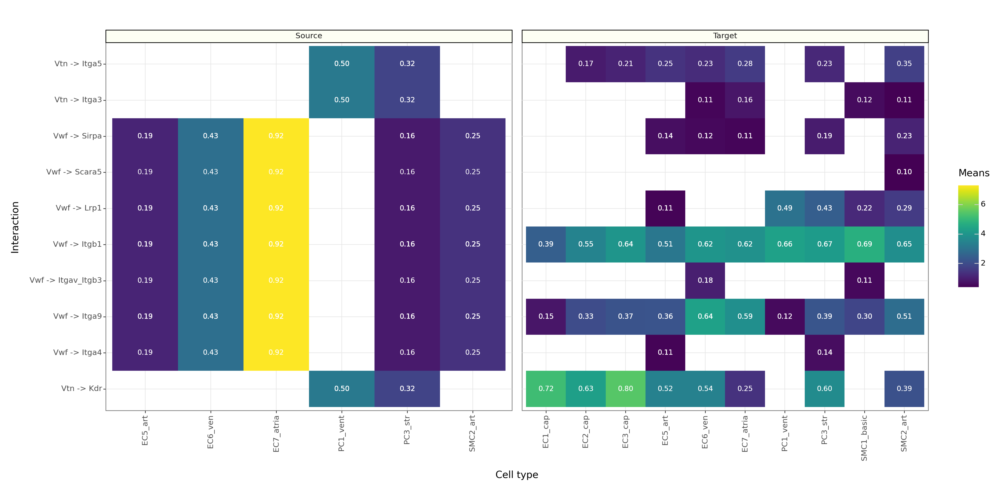

<Figure Size: (2000 x 1000)>

In [9]:
my_plot = li.pl.tileplot(adata = adata,
                         # NOTE: fill & label need to exist for both
                         # ligand_ and receptor_ columns
                         fill = 'means',
                         label = 'props',
                         label_fun = lambda x: f'{x:.2f}',
                         top_n = 10,
                         orderby = 'cellphone_pvals',
                         orderby_ascending = True,
                         figure_size = (20, 10),
                         source_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
                         target_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
                         uns_key = 'cpdb_res'
                         )
my_plot

### Run `cellchat` for trial

In [10]:
cellchat(adata, groupby = 'C_scANVI', 
            expr_prop = 0.1, 
            resource_name = 'mouseconsensus', 
            verbose = True, 
            key_added = 'ccdb_res',
            use_raw = False)
adata.uns['ccdb_res'].head()

Using `.X`!
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
6095 features of mat are empty, they will be removed.
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/pandas/core/indexing.py:1819: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/home/ruth/mambaforge/envs/liana+/lib/python3.10/site-packages/liana/method/_pipe_utils/_pre.py:144: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
Using resource `mouseconsensus`.
0.08 of entities in the resource are missing from the data.


Generating ligand-receptor stats for 22451 samples and 26190 features


 63%|██████▎   | 626/1000 [03:01<01:48,  3.45it/s]

In [ ]:
li.pl.dotplot(adata = adata,
              colour = 'lr_probs',
              size = 'cellchat_pvals',
              inverse_size = True, 
              source_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
              target_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
              figure_size = (25, 50),
              filterby = 'cellchat_pvals',
              filter_lambda = lambda x: x <= 0.05,
              uns_key = 'ccdb_res',
              cmap = 'magma'
             )

In [ ]:
my_plot = li.pl.tileplot(adata = adata,
                         # NOTE: fill & label need to exist for both
                         # ligand_ and receptor_ columns
                         fill = 'cellchat_pvals',
                         label = 'lr_probs',
                         label_fun = lambda x: f'{x:.2f}',
                         top_n = 10,
                         orderby = 'cellchat_pvals',
                         orderby_ascending = True,
                         figure_size = (20, 10),
                         source_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
                         target_labels = ['EC1_cap', 'EC2_cap', 'EC3_cap', 'EC5_art', 'EC6_ven', 'EC7_atria',
       'PC1_vent', 'PC3_str', 'SMC1_basic', 'SMC2_art'],
                         uns_key = 'ccdb_res'
                         )
my_plot

### Run aggregated estimate 

In [ ]:
li.mt.rank_aggregate(adata, 
                     groupby = 'C_scANVI', 
                     expr_prop = 0.1, 
                     verbose = True, 
                     use_raw = False,
                     resource_name = 'mouseconsensus')
adata.uns['liana_res'].head()

In [ ]:
rank_aggregate.describe()